<a href="https://colab.research.google.com/github/seifbensoltana/Image-Encryption-and-Decryption-using-AES-DES-RSA-Chaos-Maps/blob/main/Image_Encryption_and_Decryption_using_AES%2C_3DES%2C_RSA%2C_and_Chaos_Maps.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Downloading images to the Google Colab environment:

(*Downloading images to the Google Colab environment ensures that the images can be accessed and loaded into the notebook regardless of the device used to open it. This eliminates the need to have the images saved on every device that accesses the notebook.*)

In [ ]:
# Downloading cat.jpg to the Google Colab environment
!wget -O cat.jpg "https://drive.google.com/uc?id=1GstTHSVkZmhtE_1MV9bzBMEPk3Cn-xxW"

--2024-09-05 08:57:43--  https://drive.google.com/uc?id=1GstTHSVkZmhtE_1MV9bzBMEPk3Cn-xxW
Resolving drive.google.com (drive.google.com)... 74.125.195.138, 74.125.195.113, 74.125.195.101, ...
Connecting to drive.google.com (drive.google.com)|74.125.195.138|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1GstTHSVkZmhtE_1MV9bzBMEPk3Cn-xxW [following]
--2024-09-05 08:57:43--  https://drive.usercontent.google.com/download?id=1GstTHSVkZmhtE_1MV9bzBMEPk3Cn-xxW
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 74.125.197.132, 2607:f8b0:400e:c03::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|74.125.197.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 19923 (19K) [image/jpeg]
Saving to: ‘cat.jpg’

cat.jpg             100%[===================>]  19.46K  --.-KB/s    in 0s      

2024-09-05 08:57:46 (75.6 MB/s) - ‘cat.jpg’ saved [1992

# Image Encryption using Symmetric Encryption

**When encrypting an image using AES/3DES:**
The resulting encrypted data appears as a random string of bytes, which doesn't correspond to any recognizable image pattern.

**Why’s the image no longer recognizable as one :**
Image files (like JPEG, PNG, BMP) have specific headers and metadata that define how the image data should be interpreted.
When the entire file, including headers, is encrypted, the resulting file lacks the necessary structure and metadata for any image viewer to interpret it correctly.
Even if only the pixel data is encrypted and the headers are left intact, the random nature of the encrypted pixel data results in an unrecognizable image.



Loading the libraries we need for image encryption using both DES and AES algorithms:

In [ ]:
!pip install pycryptodome

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 15.3 MB/s eta 0:00:00


In [ ]:
# DES-specific libraries
from Crypto.Cipher import DES3

# AES-specific libraries
from Crypto.Cipher import AES

# Common libraries
from Crypto.Random import get_random_bytes
from Crypto.Util.Padding import pad, unpad
from PIL import Image
import os

## Image Encryption using DES

The **Data Encryption Standard (DES)** is a symmetric-key algorithm that encrypts data in blocks. For image encryption, it can be defined as follows:
* C_i​ = E_K​(P_i​)
* P_i​=D_K​(C_i​)

where:
* (C_i) and (P_i) are the ciphertext and plaintext blocks of the image, respectively;
* (E_K) represents the encryption process using key (K);
* (D_K) represents the decryption process using the same key (K);
* (K) is the 56-bit key that determines the behavior of the encryption.

DES operates on a 64-bit block size, where 64 bits of plaintext are transformed into 64 bits of ciphertext using the key (K).

<br>

To encrypt the image:

1. Divide the image into 64-bit blocks (P_i).
2. Apply the DES encryption algorithm to each block using the chosen key (K).
3. The resulting blocks of ciphertext (C_i) represent the encrypted image.

To decrypt the image:

1. Divide the encrypted image into 64-bit blocks (C_i).
2. Apply the DES decryption algorithm to each block using the same key (K).
3. The resulting blocks of plaintext (P_i) recover the original image.

<br>

The security of DES relies on the complexity of the key and the algorithm’s ability to resist cryptanalysis.

We will import DES3 from PyCryptodome to use Triple DES, a derivative of DES, for our image encryption tasks.

**Triple DES Image Encryption and Decryption**

In [ ]:
# Function to generate random keys and initialization vector for Triple DES
def generate_keys_iv():
    key1 = get_random_bytes(8)
    key2 = get_random_bytes(8)
    key3 = get_random_bytes(8)
    iv = get_random_bytes(8)  # IV must be 8 bytes for DES3
    return key1, key2, key3, iv

# Function to encrypt data using Triple DES encryption
def triple_des_encrypt(data, key1, key2, key3, iv):
    cipher = DES3.new(key1 + key2 + key3, DES3.MODE_CBC, iv)
    return cipher.encrypt(pad(data, DES3.block_size))

# Function to decrypt data using Triple DES decryption
def triple_des_decrypt(data, key1, key2, key3, iv):
    cipher = DES3.new(key1 + key2 + key3, DES3.MODE_CBC, iv)
    return unpad(cipher.decrypt(data), DES3.block_size)

# Function to encrypt an image file
def encrypt_image(image_path, keys_path):
    with open(image_path, 'rb') as image_file:
        image_data = image_file.read()

    key1, key2, key3, iv = generate_keys_iv()

    with open(keys_path, 'wb') as keys_file:
        keys_file.write(key1 + key2 + key3 + iv)

    encrypted_data = triple_des_encrypt(image_data, key1, key2, key3, iv)

    with open('des_encrypted_image.enc', 'wb') as enc_file:
        enc_file.write(encrypted_data)

# Function to decrypt an image file
def decrypt_image(encrypted_path, keys_path, output_image_path):
    with open(encrypted_path, 'rb') as enc_file:
        encrypted_data = enc_file.read()

    with open(keys_path, 'rb') as keys_file:
        key_data = keys_file.read()
        key1 = key_data[:8]
        key2 = key_data[8:16]
        key3 = key_data[16:24]
        iv = key_data[24:32]

    decrypted_data = triple_des_decrypt(encrypted_data, key1, key2, key3, iv)

    with open(output_image_path, 'wb') as image_file:
        image_file.write(decrypted_data)

# Define file paths for the image and keys
image_path = 'cat.jpg'
keys_path = 'keys.bin'
encrypted_path = 'des_encrypted_image.enc'
output_image_path = 'des_decrypted_cat.jpg'

# Encrypt the image using the defined functions
encrypt_image(image_path, keys_path)

# Decrypt the image using the defined functions
decrypt_image(encrypted_path, keys_path, output_image_path)


## Image Encryption using  AES

The Advanced Encryption Standard (AES) is a symmetric block cipher that encrypts data in fixed-size blocks. AES image encryption can be defined as follows:
* Ci​=EK​(Pi​)
* Pi​=DK​(Ci​)

where:

* (C_i) and (P_i) are the ciphertext and plaintext blocks of the image, respectively;
* (E_K) represents the encryption process using key (K);
* (D_K) represents the decryption process using the same key (K);
* (K) is the encryption key, which can be 128, 192, or 256 bits long.

AES operates on a 128-bit block size, where 128 bits of plaintext are transformed into 128 bits of ciphertext using the key (K).

<br>

To encrypt the image:
1. Divide the image into 128-bit blocks (P_i).
2. Apply the AES encryption algorithm to each block using the chosen key (K).
3. The resulting blocks of ciphertext (C_i) represent the encrypted image.

To decrypt the image:
1. Divide the encrypted image into 128-bit blocks (C_i).
2. Apply the AES decryption algorithm to each block using the same key (K).
3. The resulting blocks of plaintext (P_i) recover the original image.

**AES Image Encryption**

In [ ]:
def encrypt_image(image_path, output_path, keys_path):
    """
    Encrypts an image using the Advanced Encryption Standard (AES).

    Args:
        image_path (str): Path to the input image.
        output_path (str): Path to save the encrypted image.
        keys_path (str): Path to save the keys.

    Returns:
        None
    """
    # Open the image
    with Image.open(image_path) as img:
        img = img.convert("RGB")
        data = img.tobytes()

    # Pad the data to be a multiple of 16 bytes
    padded_data = pad(data, AES.block_size)

    # Initialize a list to store the keys
    keys = []

    # Encrypt the data block by block
    encrypted_data = b""
    for i in range(0, len(padded_data), 16):
        block = padded_data[i:i+16]
        key = get_random_bytes(16)  # Generate a new key for each block
        cipher = AES.new(key, AES.MODE_ECB)
        encrypted_block = cipher.encrypt(block)
        encrypted_data += encrypted_block
        keys.append(key)

    # Save the encrypted data to a new file
    with open(output_path, 'wb') as f:
        f.write(encrypted_data)

    # Save the keys to a file
    with open(keys_path, 'wb') as f:
        for key in keys:
            f.write(key)

# Paths and filenames
image_path = 'cat.jpg'
output_path = 'aes_cat_encrypted.jpg'
keys_path = 'aes_keys.bin'

# Encrypt the image
encrypt_image(image_path, output_path, keys_path)

print(f"Image encrypted and saved to {output_path}")
print(f"Keys saved to {keys_path}")

Image encrypted and saved to aes_cat_encrypted.jpg
Keys saved to aes_keys.bin


In [ ]:
# Function to decrypt an image encrypted with AES
def decrypt_image(encrypted_image_path, output_path, keys_path, width, height):
    """
    Decrypts an AES-encrypted image using the corresponding keys.

    Args:
        encrypted_image_path (str): Path to the encrypted image file.
        output_path (str): Path to save the decrypted image.
        keys_path (str): Path to the file containing the AES keys.
        width (int): Width of the original image.
        height (int): Height of the original image.

    Returns:
        None
    """
    # Read the encrypted data from the file
    with open(encrypted_image_path, 'rb') as f:
        encrypted_data = f.read()

    # Read the keys from the file and store them in a list
    with open(keys_path, 'rb') as f:
        keys = [f.read(16) for _ in range(0, len(encrypted_data), 16)]

    # Decrypt the data block by block using the keys
    decrypted_data = b""
    for i in range(0, len(encrypted_data), 16):
        block = encrypted_data[i:i+16]
        key = keys[i // 16]  # Use the corresponding key for each block
        cipher = AES.new(key, AES.MODE_ECB)
        decrypted_block = cipher.decrypt(block)
        decrypted_data += decrypted_block

    # Unpad the decrypted data to its original size
    decrypted_data = unpad(decrypted_data, AES.block_size)

    # Recreate the image from the decrypted data
    img = Image.frombytes('RGB', (width, height), decrypted_data)

    # Save the decrypted image to the specified path
    img.save(output_path)

# Paths for the encrypted image, keys, and output
encrypted_image_path = 'aes_cat_encrypted.jpg'
output_path = 'aes_cat_decrypted.jpg'
keys_path = 'aes_keys.bin'
width, height = 250, 250  # Dimensions of the original image

# Decrypt the image using the defined function
decrypt_image(encrypted_image_path, output_path, keys_path, width, height)

# Print statements to confirm the actions taken
print(f"Image decrypted and saved to {output_path}")
print(f"Keys used from {keys_path}")

Image decrypted and saved to aes_cat_decrypted.jpg
Keys used from aes_keys.bin


# Image Encryption using Assymmetric Encryption

The RSA algorithm is an asymmetric-key cryptosystem that encrypts data using two different keys: a public key for encryption and a private key for decryption. It can be defined as follows:

* C = E_pubK(P)
* P = D_privK(C)

where:

* (C) and (P) are the ciphertext and plaintext data, respectively;
* (E_pubK) represents the encryption process using the public key (pubK);
* (D_privK) represents the decryption process using the private key (privK);
* (pubK) is the public key used for encryption;
* (privK) is the private key used for decryption.

<br>

**To encrypt the image:**

1. Generate a public-private key pair (pubK, privK).
2. Encrypt the symmetric key (used to encrypt the image data) using the public key (pubK).
3. The resulting encrypted key can then be securely transmitted alongside the encrypted image data.

**To decrypt the image:**

1. Decrypt the encrypted symmetric key using the private key (privK).
2. Use the decrypted symmetric key to decrypt the image data.

The security of RSA relies on the computational difficulty of factoring large prime numbers and the secure management of the public and private keys.

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
%matplotlib inline
my_img = cv2.imread('cat.jpg')

#RSA
from random import randrange, getrandbits
def power(a,d,n):
  ans=1;
  while d!=0:
    if d%2==1:
      ans=((ans%n)*(a%n))%n
    a=((a%n)*(a%n))%n
    d>>=1
  return ans;
def MillerRabin(N,d):
  a = randrange(2, N - 1)
  x=power(a,d,N);
  if x==1 or x==N-1:
    return True;
  else:
    while(d!=N-1):
      x=((x%N)*(x%N))%N;
      if x==1:
        return False;
      if x==N-1:
        return True;
      d<<=1;
  return False;
def is_prime(N,K):
  if N==3 or N==2:
    return True;
  if N<=1 or N%2==0:
    return False;
  d=N-1
  while d%2!=0:
    d/=2;
  for _ in range(K):
    if not MillerRabin(N,d):
      return False;
  return True;
def generate_prime_candidate(length):
  # generate random bits
  p = getrandbits(length)
  # apply a mask to set MSB and LSB to 1
  # Set MSB to 1 to make sure we have a Number of 1024 bits.
  # Set LSB to 1 to make sure we get a Odd Number.
  p |= (1 << length - 1) | 1
  return p
def generatePrimeNumber(length):
  A=4
  while not is_prime(A, 128):
        A = generate_prime_candidate(length)
  return A
length=5 #instead of 1024
P=generatePrimeNumber(length)
Q=generatePrimeNumber(length)
print("The value of P is :",P)
print("The value of Q is :",Q)
#Step 2: Calculate N=P*Q and Euler Totient Function = (P-1)*(Q-1)
N=P*Q
eulerTotient=(P-1)*(Q-1)
print("The value of N is :",N)
print("The EulerTotient is :",eulerTotient)
#Step 3: Find E such that GCD(E,eulerTotient)=1(i.e., e should be co-prime) such that it satisfies this condition:-  1<E<eulerTotient
def GCD(a,b):
  if a==0:
    return b;
  return GCD(b%a,a)
E=generatePrimeNumber(4)
while GCD(E,eulerTotient)!=1:
  E=generatePrimeNumber(4)
print("The value of E is ",E)
# Step 4: Find D.
#For Finding D: It must satisfies this property:-  (D*E)Mod(eulerTotient)=1;
#Now we have two Choices
# 1. That we randomly choose D and check which condition is satisfying above condition.
# 2. For Finding D we can Use Extended Euclidean Algorithm: ax+by=1 i.e., eulerTotient(x)+E(y)=GCD(eulerTotient,e)
#Here, Best approach is to go for option 2.( Extended Euclidean Algorithm.)
def gcdExtended(E,eulerTotient):
  a1,a2,b1,b2,d1,d2=1,0,0,1,eulerTotient,E
  while d2!=1:
    k=(d1//d2)
    temp=a2
    a2=a1-(a2*k)
    a1=temp
    temp=b2
    b2=b1-(b2*k)
    b1=temp
    temp=d2
    d2=d1-(d2*k)
    d1=temp
    D=b2
  if D>eulerTotient:
    D=D%eulerTotient
  elif D<0:
    D=D+eulerTotient
  return D
D=gcdExtended(E,eulerTotient)
print("The value of D is :",D)
row,col=my_img.shape[0],my_img.shape[1]
enc = [[0 for x in range(3000)] for y in range(3000)]


The value of P is : 17
The value of Q is : 19
The value of N is : 323
The EulerTotient is : 288
The value of E is  11
The value of D is : 131


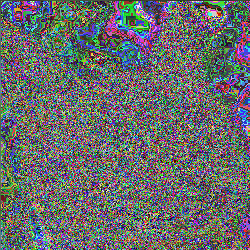

True

In [ ]:
#Step 5: Encryption
for i in range(1,250):
  for j in range(1,250):
    r,g,b=my_img[i,j]
    C1=power(r,E,N)
    C2=power(g,E,N)
    C3=power(b,E,N)
    enc[i][j]=[C1,C2,C3]
    C1=C1%256
    C2=C2%256
    C3=C3%256
    my_img[i,j]=[C1,C2,C3]
cv2_imshow(my_img)
cv2.imwrite('rsa_cat_encrypted.jpg', my_img)

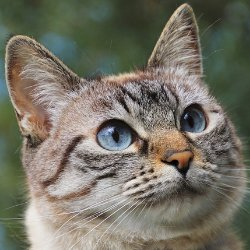

True

In [ ]:
#Step 6: Decryption
for i in range(1,250):
  for j in range(1,250):
    r,g,b=enc[i][j]
    M1=power(r,D,N)
    M2=power(g,D,N)
    M3=power(b,D,N)
    my_img[i,j]=[M1,M2,M3]
cv2_imshow(my_img)
cv2.imwrite('rsa_cat_decrypted.jpg', my_img)

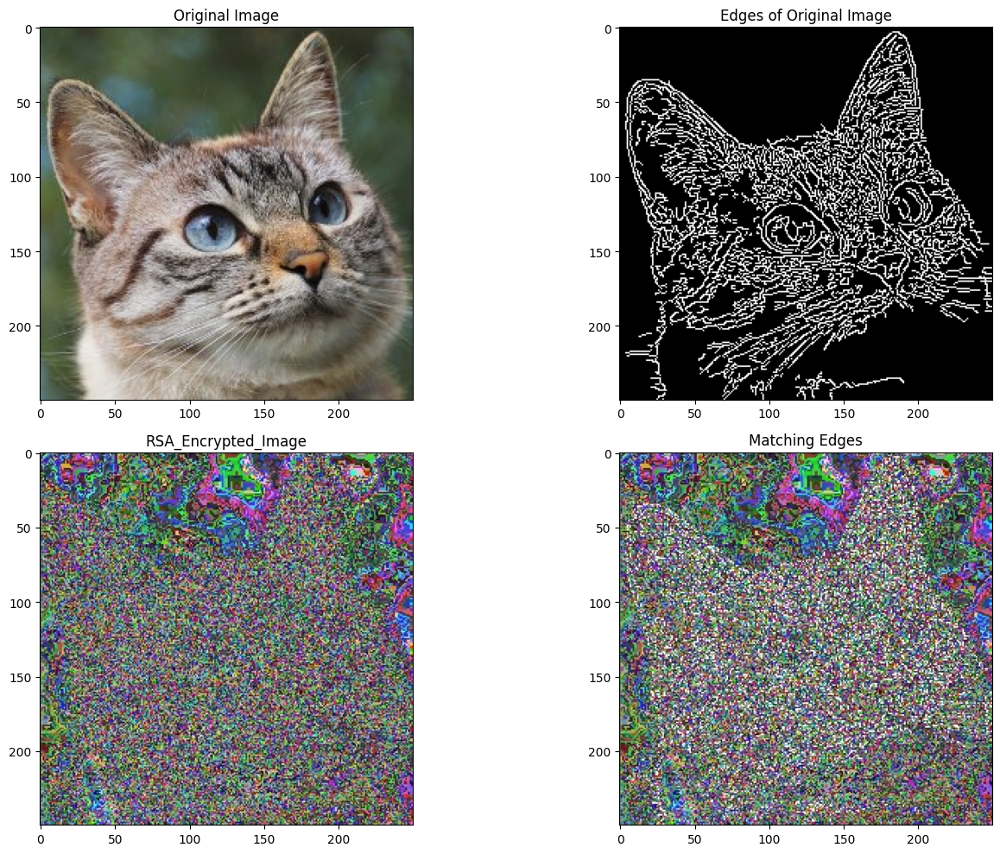

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def load_image(path, name):
    image = cv2.imread(path)
    if image is None:
        raise FileNotFoundError(f"Error: could not load '{name}'. Please check the file path.")
    return image

try:
    # Load images
    img_cat = load_image('cat.jpg', 'cat.jpg')
    img_bg = load_image('rsa_cat_encrypted.jpg', 'rsa_cat_encrypted.jpg')


    # Convert cat image to grayscale
    gray_cat = cv2.cvtColor(img_cat, cv2.COLOR_BGR2GRAY)

    # Perform edge detection using Canny
    edges_cat = cv2.Canny(gray_cat, 100, 200)

    # Ensure the background image is in grayscale for edge detection
    gray_bg = cv2.cvtColor(img_bg, cv2.COLOR_BGR2GRAY)
    edges_bg = cv2.Canny(gray_bg, 100, 200)

    # Create an empty overlay image with the same size as the background image
    overlay = np.zeros_like(img_bg)

    # Find the matching edges
    matching_edges = cv2.bitwise_and(edges_cat, edges_bg)

    # Create an overlay with the matching edges set to white
    overlay[matching_edges != 0] = [255, 255, 255]

    # Add the overlay to the background image
    result = cv2.addWeighted(img_bg, 1, overlay, 1, 0)

    # Display the original images, edge image, and the result
    plt.figure(figsize=(15, 10))

    plt.subplot(2, 2, 1)
    plt.title('Original Image')
    plt.imshow(cv2.cvtColor(img_cat, cv2.COLOR_BGR2RGB))

    plt.subplot(2, 2, 2)
    plt.title('Edges of Original Image')
    plt.imshow(edges_cat, cmap='gray')

    plt.subplot(2, 2, 3)
    plt.title('RSA_Encrypted_Image')
    plt.imshow(cv2.cvtColor(img_bg, cv2.COLOR_BGR2RGB))

    plt.subplot(2, 2, 4)
    plt.title('Matching Edges')
    plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))

    plt.tight_layout()
    plt.show()

except FileNotFoundError as e:
    print(e)
except Exception as e:
    print(f"An unexpected error occurred: {e}")


# Image Encryption using Chaos Maps

**What are Chaos Maps?**

Chaos maps are mathematical functions that exhibit seemingly random behavior despite being deterministic (meaning they follow a specific set of rules). This pseudo-randomness makes them valuable tools in cryptography.
Image encryption with chaos maps typically involves two key operations:
*   Confusion: This scrambles the position of pixel values in the image making the original data unrecognizable. Chaos maps are used to generate sequences that determine how pixels are shuffled within the image.
*   Diffusion: This introduces high dependency between neighboring pixels in the image. Even a small change in the original image significantly alters the encrypted version. Again, chaotic maps are used to control how this diffusion is achieved.


<br>

**Why Chaos Maps for Encryption?**

* Chaos maps offer great flexibility for image encryption. By creatively using the chaotic sequences as pixel coordinates, color values, offsets, or indices, you can design robust encryption schemes tailored to specific security requirements.
* The inherent sensitivity and complexity of chaotic maps provide a high level of security by making the encryption highly dependent on initial conditions and the parameters of the chaotic system.

Python libraries needed for image encryption with chaos maps:

In [ ]:
from PIL import Image
import numpy as np
import os
from matplotlib.pyplot import imshow
import matplotlib.pyplot as plt
import cv2
import random
from math import log
from google.colab.patches import cv2_imshow
from tqdm import tqdm
from IPython.display import Image as IPImage, display

## Arnold Cat Map

Arnold's cat map is a chaotic map commonly used for pixel manipulation. It applies a transformation to the image that essentially shuffles the pixels by stretching and folding the image. When an optimal number of transform iterations is achieved, the resulting image becomes incomprehensible and thus encrypted.

<br>

The transformation applied to the image is as follows:

R([x, y]) = [(x + y) mod n, (x + 2y) mod n] , where:
* x and y represent the pixel coordinates within the image (both modulo n).
* n represents the image's dimension (width or height, assuming a square image).


When the transformation is repeated enough times, the original image reappears. The number of iterations 'n' after which the original image reappears is given by the following rules of thumb:

In [ ]:
# The ArnoldCatTransform function applies a chaotic Arnold's cat map to scramble the image pixels.
def ArnoldCatTransform(img, num):
    n = img.shape[0]
    img_arnold = np.zeros_like(img)
    for x in range(n):
        for y in range(n):
            img_arnold[x, y] = img[(x + y) % n, (x + 2 * y) % n]
    return img_arnold

# The ArnoldCatEncryption function encrypts an image using the Arnold Cat Transform iteratively.
def ArnoldCatEncryption(imageName, iterations):
    img = cv2.imread(imageName)
    for i in range(iterations):
        img = ArnoldCatTransform(img, i)
    cv2.imwrite("ArnoldcatEnc.png", img)
    return img

In [ ]:
image = "cat.jpg"
iterations = 333

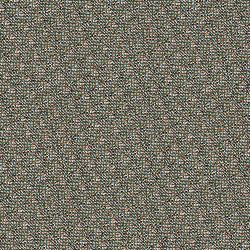

In [ ]:
ArnoldCatEncryptionIm = ArnoldCatEncryption(image, iterations)
cv2_imshow(ArnoldCatEncryptionIm)

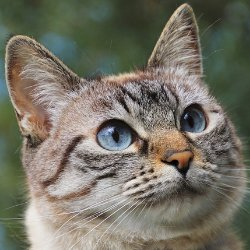

In [ ]:
# The ArnoldCatDecryption function decrypts an image that was encrypted using the Arnold Cat Transform.
def ArnoldCatDecryption(imageName, iterations):
    img = cv2.imread(imageName)
    rows, cols, ch = img.shape
    dimension = rows
    decrypt_it = dimension
    if dimension % 2 == 0 and 5 ** int(round(log(dimension / 2, 5))) == int(dimension / 2):
        decrypt_it = 3 * dimension
    elif 5 ** int(round(log(dimension, 5))) == int(dimension):
        decrypt_it = 2 * dimension
    elif dimension % 6 == 0 and 5 ** int(round(log(dimension / 6, 5))) == int(dimension / 6):
        decrypt_it = 2 * dimension
    else:
        decrypt_it = int(12 * dimension / 7)
    for i in range(iterations, decrypt_it):
        img = ArnoldCatTransform(img, i)
    cv2.imwrite("ArnoldcatDec.png", img)
    return img

ArnoldCatDecryptionIm = ArnoldCatDecryption("ArnoldcatEnc.png", iterations)
cv2_imshow(ArnoldCatDecryptionIm)

## Henon Map

The Henon map is a two-dimensional map that maps a point (xn, yn) to a new point (xn+1, yn+1). The Henon map can be defined as follows:

* *x_n+1 = 1 − ax²_n + y_n​*
* *y_n+1 = bx_n*

where:

* where *(xn, yn)* and *(Xn+1, yn+1)* are the coordinates of a point before and after the mapping, respectively;
* *a* and *b* are parameters that determine the behavior of the map.

The map starts to behave chaotically when a = 1.4 and b = 0.3.


In [ ]:
# This function opens an image and converts it into a matrix of its pixel values. It also determines if the image is in color or grayscale.
def getImageMatrix(imageName):
    im = Image.open(imageName)
    color = im.mode in ['RGB', 'RGBA']
    image_size = im.size
    image_matrix = []
    for width in range(image_size[0]):
        row = []
        for height in range(image_size[1]):
            if color:
                row.append(im.getpixel((width, height)))
            else:
                row.append(im.getpixel((width, height))[0])
        image_matrix.append(row)
    return image_matrix, image_size[0], color

# This function generates a Henon map, which is a chaotic attractor that can be used to create a pseudo-random sequence for encryption.
def genHenonMap(dimension, key):
    x, y = key
    sequenceSize = dimension * dimension * 8
    bitSequence = []
    byteArray = []
    TImageMatrix = []
    for i in range(sequenceSize):
        xN = y + 1 - 1.4 * x**2
        yN = 0.3 * x
        x, y = xN, yN

        bit = 0 if xN <= 0.4 else 1
        bitSequence.append(bit)

        if len(bitSequence) == 8:
            decimal = int(''.join(map(str, bitSequence)), 2)
            byteArray.append(decimal)
            bitSequence.clear()

        byteArraySize = dimension * 8
        if i % byteArraySize == byteArraySize - 1:
            TImageMatrix.append(byteArray)
            byteArray = []
    return TImageMatrix

# This function applies the Henon map to encrypt an image, altering its pixel values to secure its contents.
def HenonEncryption(imageName, key):
    imageMatrix, dimension, color = getImageMatrix(imageName)
    transformationMatrix = genHenonMap(dimension, key)
    resultantMatrix = []
    for i in range(dimension):
        row = []
        for j in range(dimension):
            pixel = imageMatrix[i][j]
            if color:
                row.append(tuple([transformationMatrix[i][j] ^ channel for channel in pixel]))
            else:
                row.append(transformationMatrix[i][j] ^ pixel)
        resultantMatrix.append(row)

    mode = "RGB" if color else "L"
    im = Image.new(mode, (dimension, dimension))
    for x in range(dimension):
        for y in range(dimension):
            im.putpixel((x, y), resultantMatrix[x][y])
    im.save("HenonEnc.png", "PNG")

# This function reverses the encryption process, applying the Henon map to decrypt an image and restore its original pixel values.
def HenonDecryption(imageNameEnc, key):
    imageMatrix, dimension, color = getImageMatrix(imageNameEnc)
    transformationMatrix = genHenonMap(dimension, key)
    henonDecryptedImage = []
    for i in range(dimension):
        row = []
        for j in range(dimension):
            pixel = imageMatrix[i][j]
            if color:
                row.append(tuple([transformationMatrix[i][j] ^ channel for channel in pixel]))
            else:
                row.append(transformationMatrix[i][j] ^ pixel)
        henonDecryptedImage.append(row)

    mode = "RGB" if color else "L"
    im = Image.new(mode, (dimension, dimension))
    for x in range(dimension):
        for y in range(dimension):
            im.putpixel((x, y), henonDecryptedImage[x][y])
    im.save("HenonDec.png", "PNG")

In [ ]:
image = "cat.jpg"
key = (1.3, 0.3)

Encrypting the original image and displaying it:

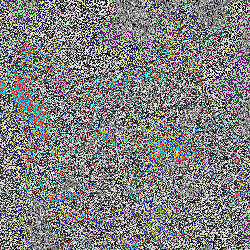

In [ ]:
# Encrypt the image
HenonEncryption(image, key)

# Read the encrypted image using OpenCV
encrypted_image = cv2.imread("HenonEnc.png")

# Display the encrypted image
cv2_imshow(encrypted_image)

Decrypting the encrypted image and displaying it:

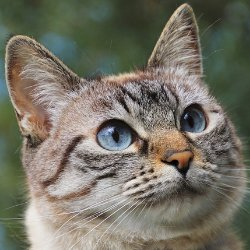

In [ ]:
HenonDecryption("HenonEnc.png", key)
decrypted_image = cv2.imread("HenonDec.png")
cv2_imshow(decrypted_image)

## Logistic Map

The Logistic Chaos Map is defined by the recursive equation:
* *x_n + 1 ​= rx_n​(1−x_n​)*

where:
* x_0 represents the initial parameter or starting value of the logistic map, with 0 ≤ x_ ≤ 1.
* r is the control parameter or growth rate of the logistic map, and it has a range of [0, 4].

Chaotic behavior is observed only when the control parameter, r is within the range of (3.56995, 4).

<br>

This map is known for its ability to produce complex, chaotic behavior from very simple non-linear dynamics. The behavior of the map can vary dramatically with small changes in the parameter (r) or the initial condition (x_0).

<br>



In [ ]:
import numpy as np
import cv2

def logistic_map(r, x0, n):
    x = np.zeros(n)
    x[0] = x0
    for i in range(1, n):
        x[i] = r * x[i-1] * (1 - x[i-1])
    return x

def encrypt_image(image_path, r, x0):
    # Load image
    image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
    height, width, channels = image.shape

    if channels != 3:
        raise ValueError("The input image must have 3 color channels (RGB).")

    # Split the image into its color channels
    blue_channel, green_channel, red_channel = cv2.split(image)

    # Flatten each channel
    red_flattened = red_channel.flatten()
    green_flattened = green_channel.flatten()
    blue_flattened = blue_channel.flatten()

    # Generate chaotic sequences for each channel
    n = len(red_flattened)
    chaotic_sequence_red = logistic_map(r, x0, n)
    chaotic_sequence_green = logistic_map(r, x0, n)
    chaotic_sequence_blue = logistic_map(r, x0, n)

    # Normalize chaotic sequences to [0, 255] and convert to uint8
    chaotic_sequence_red = np.floor(chaotic_sequence_red * 256).astype(np.uint8)
    chaotic_sequence_green = np.floor(chaotic_sequence_green * 256).astype(np.uint8)
    chaotic_sequence_blue = np.floor(chaotic_sequence_blue * 256).astype(np.uint8)

    # Encrypt each channel
    encrypted_red_flattened = np.bitwise_xor(red_flattened, chaotic_sequence_red)
    encrypted_green_flattened = np.bitwise_xor(green_flattened, chaotic_sequence_green)
    encrypted_blue_flattened = np.bitwise_xor(blue_flattened, chaotic_sequence_blue)

    # Reshape to original channel dimensions
    encrypted_red_channel = encrypted_red_flattened.reshape((height, width))
    encrypted_green_channel = encrypted_green_flattened.reshape((height, width))
    encrypted_blue_channel = encrypted_blue_flattened.reshape((height, width))

    # Merge encrypted channels back into an image
    encrypted_image = cv2.merge([encrypted_blue_channel, encrypted_green_channel, encrypted_red_channel])

    # Save encrypted image
    encrypted_image_path = 'LogisticEnc.png'
    cv2.imwrite(encrypted_image_path, encrypted_image)
    print(f'Encrypted image saved as {encrypted_image_path}')

    return encrypted_image

def decrypt_image(encrypted_image_path, r, x0):
    # Load encrypted image
    encrypted_image = cv2.imread(encrypted_image_path, cv2.IMREAD_UNCHANGED)
    height, width, channels = encrypted_image.shape

    if channels != 3:
        raise ValueError("The input image must have 3 color channels (RGB).")

    # Split the image into its color channels
    blue_channel, green_channel, red_channel = cv2.split(encrypted_image)

    # Flatten each channel
    red_flattened = red_channel.flatten()
    green_flattened = green_channel.flatten()
    blue_flattened = blue_channel.flatten()

    # Generate chaotic sequences for each channel
    n = len(red_flattened)
    chaotic_sequence_red = logistic_map(r, x0, n)
    chaotic_sequence_green = logistic_map(r, x0, n)
    chaotic_sequence_blue = logistic_map(r, x0, n)

    # Normalize chaotic sequences to [0, 255] and convert to uint8
    chaotic_sequence_red = np.floor(chaotic_sequence_red * 256).astype(np.uint8)
    chaotic_sequence_green = np.floor(chaotic_sequence_green * 256).astype(np.uint8)
    chaotic_sequence_blue = np.floor(chaotic_sequence_blue * 256).astype(np.uint8)

    # Decrypt each channel
    decrypted_red_flattened = np.bitwise_xor(red_flattened, chaotic_sequence_red)
    decrypted_green_flattened = np.bitwise_xor(green_flattened, chaotic_sequence_green)
    decrypted_blue_flattened = np.bitwise_xor(blue_flattened, chaotic_sequence_blue)

    # Reshape to original channel dimensions
    decrypted_red_channel = decrypted_red_flattened.reshape((height, width))
    decrypted_green_channel = decrypted_green_flattened.reshape((height, width))
    decrypted_blue_channel = decrypted_blue_flattened.reshape((height, width))

    # Merge decrypted channels back into an image
    decrypted_image = cv2.merge([decrypted_blue_channel, decrypted_green_channel, decrypted_red_channel])

    # Save decrypted image
    decrypted_image_path = 'LogisticDec.png'
    cv2.imwrite(decrypted_image_path, decrypted_image)
    print(f'Decrypted image saved as {decrypted_image_path}')

    return decrypted_image


In [ ]:
# Example usage
r = 3.99999  # Control parameter
x0 = 0.99  # Initial value
image_path = 'cat.jpg'

Encrypted image saved as LogisticEnc.png


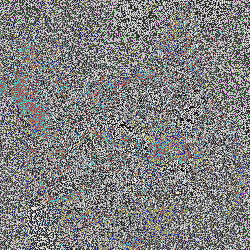

In [ ]:
# Encrypt the image
encrypted_image = encrypt_image(image_path, r, x0)
cv2_imshow(encrypted_image)

Decrypted image saved as LogisticDec.png


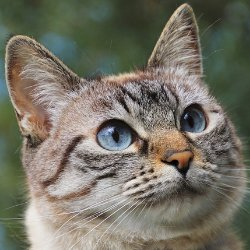

In [ ]:
# Decrypt the image
decrypted_image = decrypt_image('LogisticEnc.png', r, x0)
cv2_imshow(decrypted_image)

## Duffing Map

The Duffing map also called the 'Holmes map' is a discrete-time dynamical system. It is
an example of a dynamical system that exhibits chaotic behavior. The Duffing map takes
a point (xn, yn) in the plane and maps it to a new point given by:

$x_{n+1}$= $y_{n}$

$y_{n+1}$= -b$x_{n}$+ a$y_{n}$ - $y_{n}^{3}$

The map depends on the two constants a and b. These are usually set to a = 2.75 and
b = 0.2 to produce chaotic behavior.


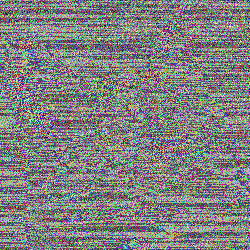

In [ ]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

def duffing_map(key, n):
    x = np.zeros(n)
    y = np.zeros(n)
    x[0] = key[0]
    y[0] = key[1]
    for i in range(1, n):
        x[i] = y[i-1]
        y[i] = -0.2 * x[i-1] + 2.75 * y[i-1] - y[i-1]**3
    return y

def encrypt_image(image_path, key):
    # Load the image
    image = cv2.imread(image_path)

    # Get the dimensions of the image
    height, width, channels = image.shape

    # Flatten the image into a 1D array
    image_flattened = image.flatten()

    # Generate the chaotic sequence
    chaotic_sequence = duffing_map(key, len(image_flattened))

    # Normalize the chaotic sequence to the range [0, 255]
    chaotic_sequence = (chaotic_sequence * 255).astype(np.uint8)

    # XOR the image with the chaotic sequence
    encrypted_image = np.bitwise_xor(image_flattened, chaotic_sequence)

    # Reshape the encrypted image back to its original dimensions
    encrypted_image = encrypted_image.reshape((height, width, channels))

    # Save the encrypted image
    cv2.imwrite('DuffingEnc.png', encrypted_image)

    # Display the encrypted image
    cv2_imshow(encrypted_image)

# Example usage
image_path = 'cat.jpg'
key = (0.23, -0.13)
encrypt_image(image_path, key)

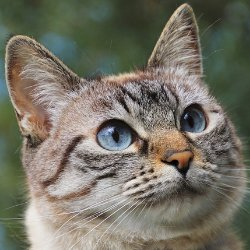

In [ ]:
def decrypt_image(encrypted_image_path, key):
    # Load the encrypted image
    encrypted_image = cv2.imread(encrypted_image_path)

    # Get the dimensions of the encrypted image
    height, width, channels = encrypted_image.shape

    # Flatten the encrypted image into a 1D array
    encrypted_image_flattened = encrypted_image.flatten()

    # Generate the chaotic sequence
    chaotic_sequence = duffing_map(key, len(encrypted_image_flattened))

    # Normalize the chaotic sequence to the range [0, 255]
    chaotic_sequence = (chaotic_sequence * 255).astype(np.uint8)

    # XOR the encrypted image with the chaotic sequence
    decrypted_image = np.bitwise_xor(encrypted_image_flattened, chaotic_sequence)

    # Reshape the decrypted image back to its original dimensions
    decrypted_image = decrypted_image.reshape((height, width, channels))

    # Save the decrypted image
    cv2.imwrite('DuffingDec.png', decrypted_image)

    # Display the decrypted image
    cv2_imshow(decrypted_image)

decrypt_image('DuffingEnc.png', key)

# Security Analysis

## Histogram Analysis

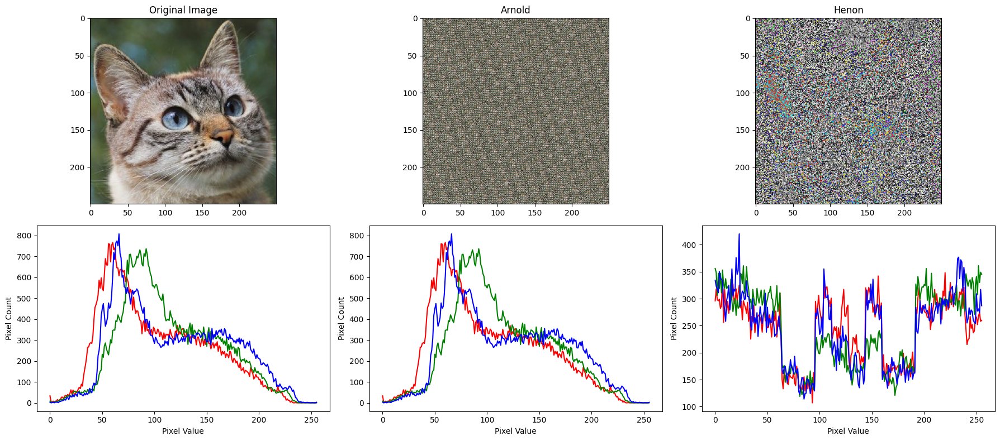

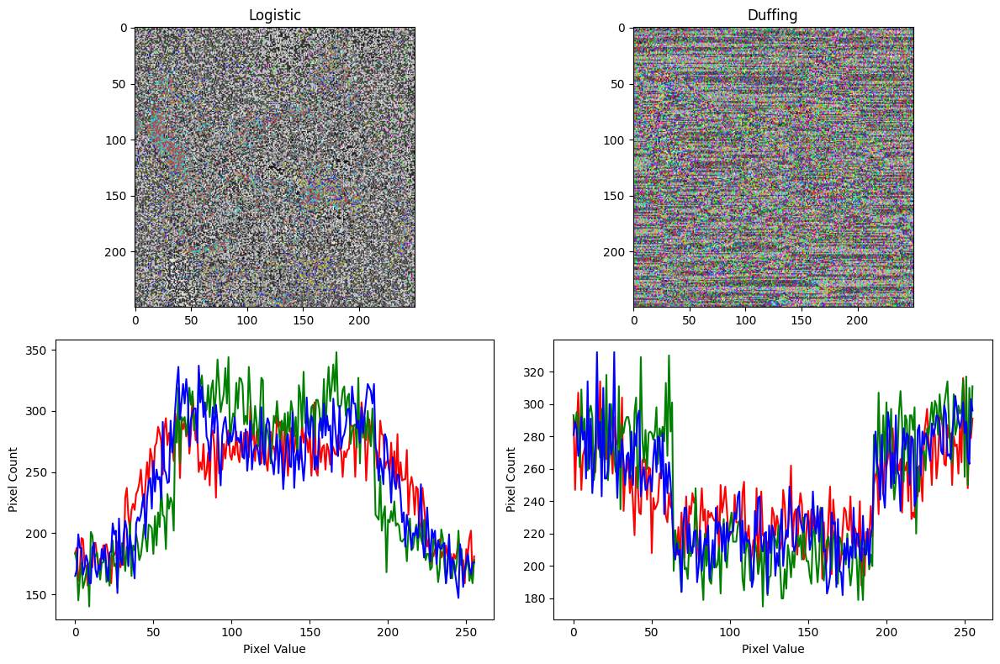

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the original image and encrypted images
original_img = cv2.imread('cat.jpg')  # Update with your image path
encrypted_imgs = [
    cv2.imread('ArnoldcatEnc.png'),  # Update with encrypted image paths
    cv2.imread('HenonEnc.png'),
    cv2.imread('LogisticEnc.png'),
    cv2.imread('DuffingEnc.png')
]

# Define color for plotting
colors = ('r', 'g', 'b')

# Create a figure and axes for the first set of plots
fig, axs1 = plt.subplots(2, 3, figsize=(18, 8))

# Plot original image and its histogram
axs1[0, 0].imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
axs1[0, 0].set_title('Original Image', fontsize=12)
axs1[0, 0].axis('on')

for i, color in enumerate(colors):
    hist = cv2.calcHist([original_img], [i], None, [256], [0, 256])
    axs1[1, 0].plot(hist, color=color)
axs1[1, 0].set_xlabel('Pixel Value')
axs1[1, 0].set_ylabel('Pixel Count')

# Plot encrypted images and their histograms (Arnold and Henon)
methods1 = ['Arnold', 'Henon']
for idx, (encrypted_img, method, ax_col) in enumerate(zip(encrypted_imgs[:2], methods1, axs1.T[1:])):
    ax_col[0].imshow(cv2.cvtColor(encrypted_img, cv2.COLOR_BGR2RGB))
    ax_col[0].set_title(method, fontsize=12)
    ax_col[0].axis('on')

    for i, color in enumerate(colors):
        hist = cv2.calcHist([encrypted_img], [i], None, [256], [0, 256])
        ax_col[1].plot(hist, color=color)
    ax_col[1].set_xlabel('Pixel Value')
    ax_col[1].set_ylabel('Pixel Count')

plt.tight_layout()
plt.show()

# Create a figure and axes for the second set of plots
fig, axs2 = plt.subplots(2, 2, figsize=(12, 8))

# Plot encrypted images and their histograms (Logistic, Duffing)
methods2 = ['Logistic', 'Duffing']
for idx, (encrypted_img, method, ax_col) in enumerate(zip(encrypted_imgs[2:], methods2, axs2.T)):
    ax_col[0].imshow(cv2.cvtColor(encrypted_img, cv2.COLOR_BGR2RGB))
    ax_col[0].set_title(method, fontsize=12)
    ax_col[0].axis('on')

    for i, color in enumerate(colors):
        hist = cv2.calcHist([encrypted_img], [i], None, [256], [0, 256])
        ax_col[1].plot(hist, color=color)
    ax_col[1].set_xlabel('Pixel Value')
    ax_col[1].set_ylabel('Pixel Count')

plt.tight_layout()
plt.show()



**Arnold’s Cat map:** The histogram for the Arnold map encrypted image still shows patterns similar to the original. This indicates that while the image appears scrambled, the pixel value distribution retains the characteristics of the original image. --> This might compromises the security of the image.


**Henon, Logistic and Duffing maps:** The histograms show a more uniform distribution compared to the original image, indicating a higher level of pixel value randomization. --> indicating more robust security against various attacks.


## Adjacent Pixel Autocorrelation

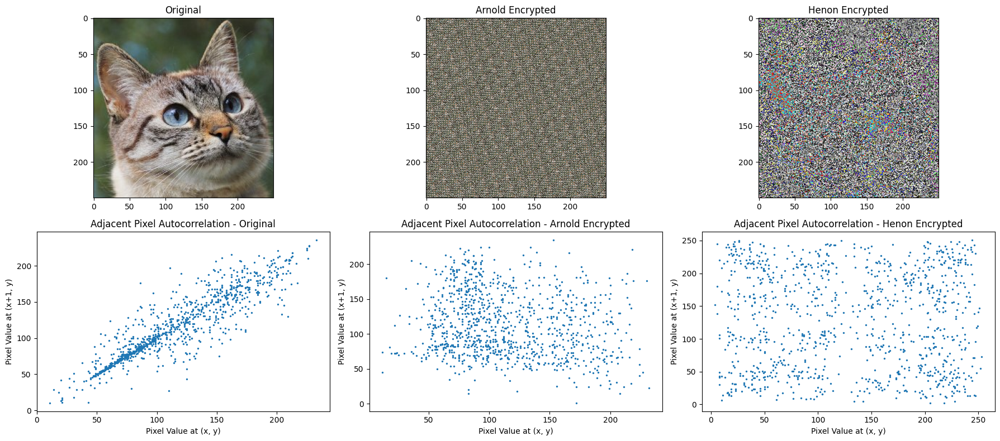

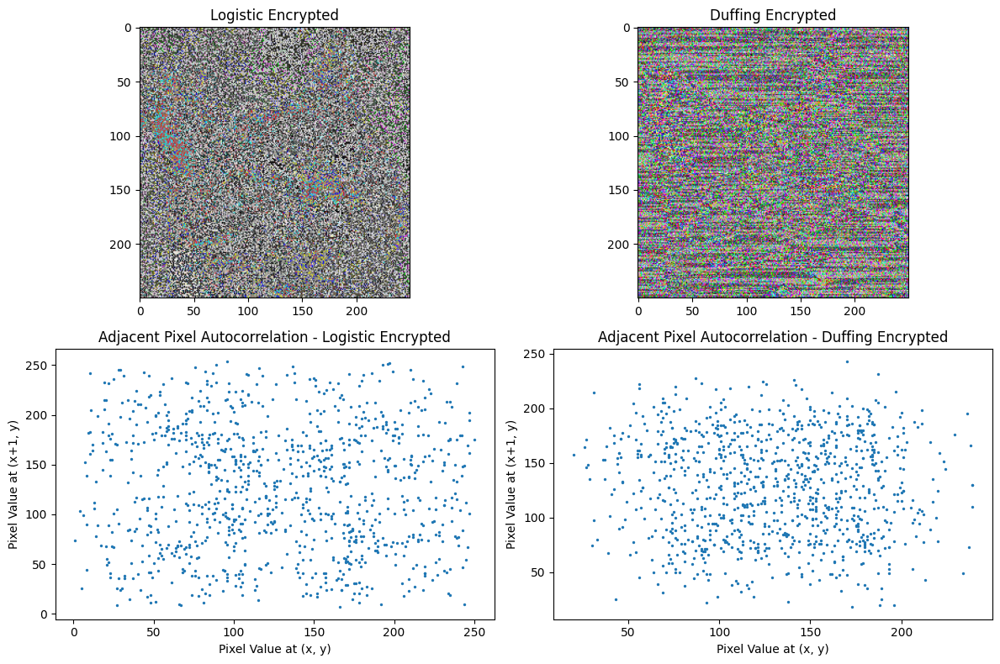

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random

def plot_adjacent_pixel_autocorrelation(image, title, ax_image, ax_scatter):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    h, w = gray_image.shape
    samples_x = []
    samples_y = []
    for _ in range(1024):  # Number of samples
        x = random.randint(0, h-2)
        y = random.randint(0, w-1)
        samples_x.append(gray_image[x, y])
        samples_y.append(gray_image[x+1, y])

    ax_image.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    ax_image.set_title(title, fontsize=12)
    ax_image.axis('on')

    ax_scatter.scatter(samples_x, samples_y, s=2)
    ax_scatter.set_title(f'Adjacent Pixel Autocorrelation - {title}', fontsize=12)
    ax_scatter.set_xlabel('Pixel Value at (x, y)')
    ax_scatter.set_ylabel('Pixel Value at (x+1, y)')

# Load the original image and encrypted images
original_img = cv2.imread('cat.jpg')  # Update with your image path
encrypted_imgs = [
    cv2.imread('ArnoldcatEnc.png'),  # Update with encrypted image paths
    cv2.imread('HenonEnc.png'),
    cv2.imread('LogisticEnc.png'),
    cv2.imread('DuffingEnc.png')
]

# Create a figure and axes for the first set of plots (Original, Arnold, Henon)
fig1, axs1 = plt.subplots(2, 3, figsize=(18, 8))
plot_adjacent_pixel_autocorrelation(original_img, 'Original', axs1[0, 0], axs1[1, 0])
plot_adjacent_pixel_autocorrelation(encrypted_imgs[0], 'Arnold Encrypted', axs1[0, 1], axs1[1, 1])
plot_adjacent_pixel_autocorrelation(encrypted_imgs[1], 'Henon Encrypted', axs1[0, 2], axs1[1, 2])
plt.tight_layout()
plt.show()

# Create a figure and axes for the second set of plots (Logistic, Duffing)
fig2, axs2 = plt.subplots(2, 2, figsize=(12, 8))
plot_adjacent_pixel_autocorrelation(encrypted_imgs[2], 'Logistic Encrypted', axs2[0, 0], axs2[1, 0])
plot_adjacent_pixel_autocorrelation(encrypted_imgs[3], 'Duffing Encrypted', axs2[0, 1], axs2[1, 1])
plt.tight_layout()
plt.show()


**Arnold:**
* The plot shows a scattered distribution with a moderate spread of points.
* The points are relatively concentrated but without any discernible pattern.

**Henon:**
* The plot shows a highly dispersed distribution.
* Points are spread out more uniformly across the entire range of pixel values, indicating high decorrelation.

**Logistic:**
* The plot shows a scattered pattern, with points spread out but slightly less uniformly than Henon.
* There is still no apparent correlation, but the dispersion is moderate compared to Henon.

**Duffing:**
* The plot shows a scattered distribution similar to Arnold.
* Points are dispersed but not as uniformly spread out as in the Henon plot.

<br>

The adjacent pixel autocorrelation plot for **Henon encryption demonstrates the most extensive dispersion**. The points are scattered more uniformly and cover a wider range compared to other encryption methods.
This indicates that Henon map encryption is particularly effective in breaking the correlation between adjacent pixels.


# Proposed Encryption Scheme

A novel encryption scheme is presented for securing images based on **Arnold cat** and **Henon chaotic maps**.
The scheme uses **Arnold cat map** for bit- and pixel-level permutations on plain and secret images, while **Henon map** creates secret images and specific parameters for the permutations.

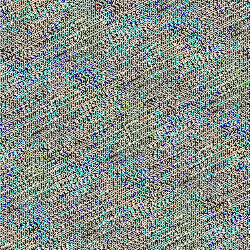

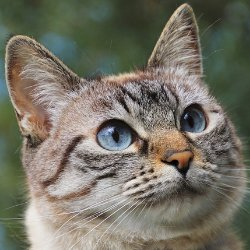

In [ ]:
import numpy as np
from PIL import Image
import math
from IPython.display import display

# Load image
im = Image.open("cat.jpg")
pix = im.load()
m = im.size[0]
# Initial Henon map values
x = 0.1
y = 0.1
pixA = []
pixB = []
savethexmat = []
savetheymat = []

paramlambda = math.floor(x * m * 5000)
paramgamma = math.floor(y * m * 5000)
#Henon Map Function
for i in range(m * m):
    xN = 1 - 1.3* x**2
    yN = 0.3 * x
    x = xN
    y = yN

    savethexmat.append(xN)
    savetheymat.append(yN)

    pixA.append(abs(math.floor(xN * paramlambda)) % 256)
    pixB.append(abs(math.floor(yN * paramgamma)) % 256)

# Convert original image to matrix
image_matrix = np.array(im)

# Arnold Cat Map function
def arnold_cat_map(image, iterations):
    N = image.shape[0]
    transformed_image = np.copy(image)
    for _ in range(iterations):
        new_image = np.copy(transformed_image)
        for i in range(N):
            for j in range(N):
                new_i = (i + j) % N
                new_j = (i + 2 * j) % N
                new_image[new_i, new_j] = transformed_image[i, j]
        transformed_image = new_image
    return transformed_image

# Inverse Arnold Cat Map function
def inverse_arnold_cat_map(image, iterations):
    N = image.shape[0]
    transformed_image = np.copy(image)
    for _ in range(iterations):
        new_image = np.copy(transformed_image)
        for i in range(N):
            for j in range(N):
                new_i = (2 * i - j) % N
                new_j = (j - i) % N
                new_image[new_i, new_j] = transformed_image[i, j]
        transformed_image = new_image
    return transformed_image

iterations = 25

# Apply Arnold Cat Map to each channel independently
permuted_image = np.zeros_like(image_matrix)
for channel in range(3):
    permuted_image[:, :, channel] = arnold_cat_map(image_matrix[:, :, channel], iterations)

# Convert Henon map images to 3-channel format
secretimagea_3ch = np.array(pixA).reshape((m, m, 1))
secretimageb_3ch = np.array(pixB).reshape((m, m, 1))

# Stack them along the channel axis
secretimagea_3ch = np.concatenate([secretimagea_3ch] * 3, axis=-1)
secretimageb_3ch = np.concatenate([secretimageb_3ch] * 3, axis=-1)

# Combine with Henon Map values for final encryption
encrypted_image = (permuted_image.astype(np.int16) + secretimagea_3ch + secretimageb_3ch) % 256

# Save and display the encrypted image
encrypted_image_pil = Image.fromarray(encrypted_image.astype('uint8'))
encrypted_image_pil.save("ArnoldHenonEnc.jpg")
display(encrypted_image_pil)

# Decryption
decrypted_image_step1 = (encrypted_image.astype(np.int16) - secretimagea_3ch - secretimageb_3ch) % 256

# Apply inverse Arnold Cat Map to each channel independently
decrypted_image = np.zeros_like(decrypted_image_step1)
for channel in range(3):
    decrypted_image[:, :, channel] = inverse_arnold_cat_map(decrypted_image_step1[:, :, channel].astype(np.uint8), iterations)

# Save and display the decrypted image
decrypted_image_pil = Image.fromarray(decrypted_image.astype('uint8'))
decrypted_image_pil.save("ArnoldHenonDec.jpg")
display(decrypted_image_pil)


**Graphs for Arnold-Henon Map**:

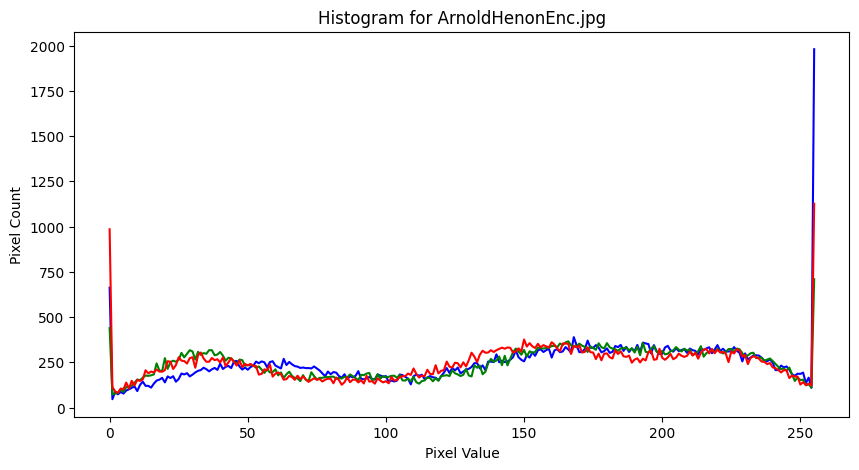

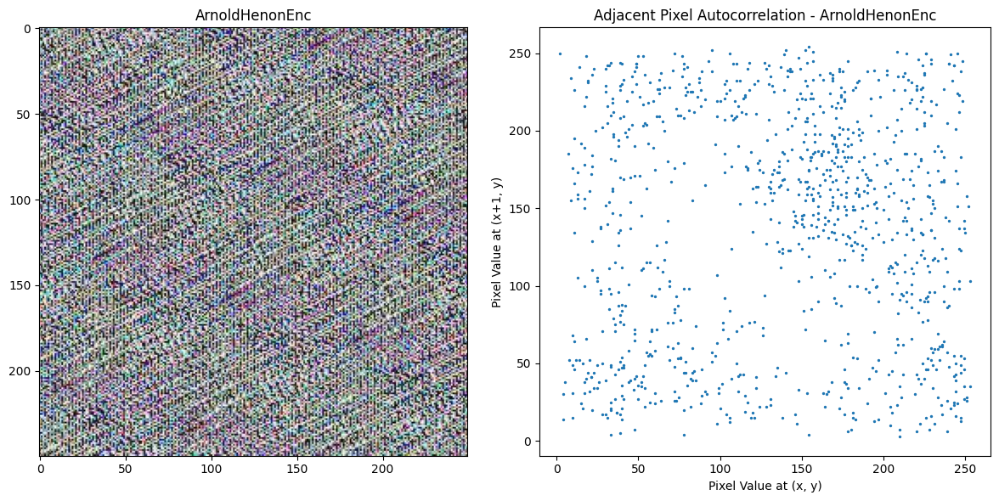

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_path = 'ArnoldHenonEnc.jpg'  # Update with your image path
image = cv2.imread(image_path)

# Check if image is loaded correctly
if image is None:
    print(f"Error loading image: {image_path}")
else:
    # Define color for plotting
    colors = ('b', 'g', 'r')  # OpenCV uses BGR by default

    # Create a figure and axes for the histogram plot
    plt.figure(figsize=(10, 5))

    # Calculate and plot histograms for each color channel
    for i, color in enumerate(colors):
        hist = cv2.calcHist([image], [i], None, [256], [0, 256])
        plt.plot(hist, color=color)

    # Set plot titles and labels
    plt.title('Histogram for ArnoldHenonEnc.jpg')
    plt.xlabel('Pixel Value')
    plt.ylabel('Pixel Count')

    # Display the histogram
    plt.show()

import cv2
import numpy as np
import matplotlib.pyplot as plt
import random

def plot_adjacent_pixel_autocorrelation(image, title):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    h, w = gray_image.shape
    samples_x = []
    samples_y = []
    for _ in range(1024):  # Number of samples
        x = random.randint(0, h-2)
        y = random.randint(0, w-1)
        samples_x.append(gray_image[x, y])
        samples_y.append(gray_image[x+1, y])

    # Create a figure for the plots
    fig, (ax_image, ax_scatter) = plt.subplots(1, 2, figsize=(12, 6))

    ax_image.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    ax_image.set_title(title, fontsize=12)
    ax_image.axis('on')

    ax_scatter.scatter(samples_x, samples_y, s=2)
    ax_scatter.set_title(f'Adjacent Pixel Autocorrelation - {title}', fontsize=12,color='black')
    ax_scatter.set_xlabel('Pixel Value at (x, y)')
    ax_scatter.set_ylabel('Pixel Value at (x+1, y)')

    plt.tight_layout()
    plt.show()

# Load the image
image_path = 'ArnoldHenonEnc.jpg'  # Update with your image path
image = cv2.imread(image_path)

# Check if the image is loaded correctly and plot
if image is None:
    print(f"Error loading image: {image_path}")
else:
    plot_adjacent_pixel_autocorrelation(image, 'ArnoldHenonEnc')



* The histogram for the Arnold-Henon encrypted image shows a highly uniform distribution with no discernible peaks or patterns. This suggests that the combination of Arnold and Henon maps has effectively erased any similarities with the original image.
* The Adjacent Autocorrelation map display a high dispersion (better than using Arnold algorithm on its own)

**Code Snippet used to compare 2 images , pixel by pixel :**

In [ ]:
import cv2
import numpy as np

def calculate_pixel_change_percentage(image1_path, image2_path):
    # Read the images
    image1 = cv2.imread(image1_path, cv2.IMREAD_GRAYSCALE)
    image2 = cv2.imread(image2_path, cv2.IMREAD_GRAYSCALE)

    # Ensure the images have the same dimensions
    if image1.shape != image2.shape:
        raise ValueError("Images must have the same dimensions for comparison")

    # Calculate the difference between the images
    difference = cv2.absdiff(image1, image2)

    # Count the number of different pixels
    num_different_pixels = np.count_nonzero(difference)

    # Calculate the total number of pixels
    total_pixels = image1.shape[0] * image1.shape[1]

    # Calculate the percentage of different pixels
    percentage_change = (num_different_pixels / total_pixels) * 100

    return percentage_change

# Example usage
image1_path = 'DuffingEnc.png'
image2_path = 'DuffingEnc5.png'

percentage_change = calculate_pixel_change_percentage(image1_path, image2_path)
print(f"Percentage of different pixels: {percentage_change:.2f}%")


AttributeError: 'NoneType' object has no attribute 'shape'

# Key Sensitivity

**Parameter Sensitivity (Encryption):** How different are the encrypted images with a slight change in the parameters:

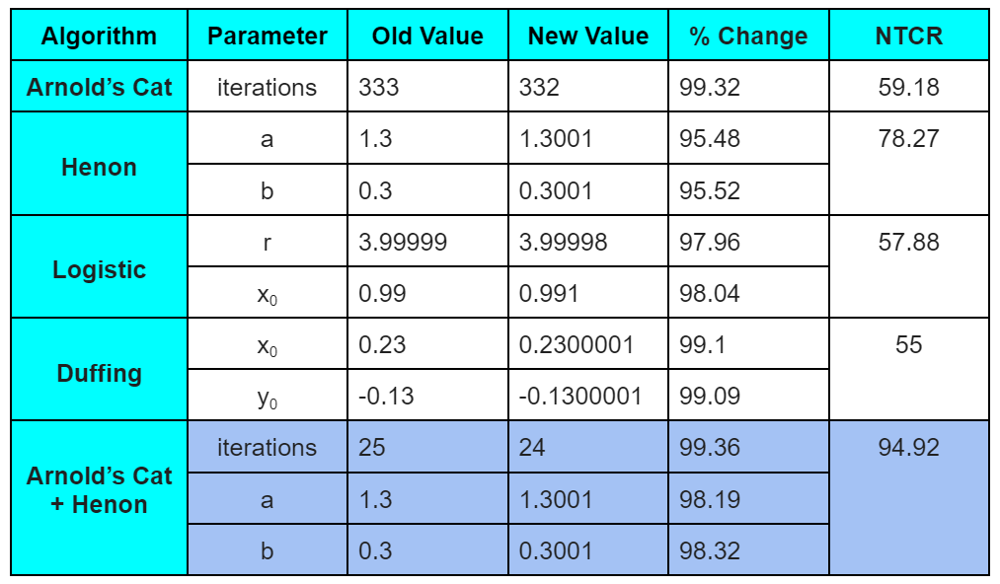

**NTCR :**Rate of change of Encrypted images (using same parameters) after changing 1 pixel in the original image:

--> Comparing the Algorithms individually, the most sensitive one is Arnold's Cat (99.32) and the least sensitive one is Henon (95.48-95.52)

--> Combining Arnold’s cat map and Henon map yields better results ; higher parameter sensitivity for both encryption and decryption, the weakness of Arnold map is fixed so we can no longer see similarities with the original image when we use incorrect but similar parameters for decryption. And finally, The NTCR increased which means very similar images yield very different encryption results.


**Parameter Sensitivity (Decryption):** How different is the decrypted image compared to the original image; after using incorrect (but similar) decryption parameters:


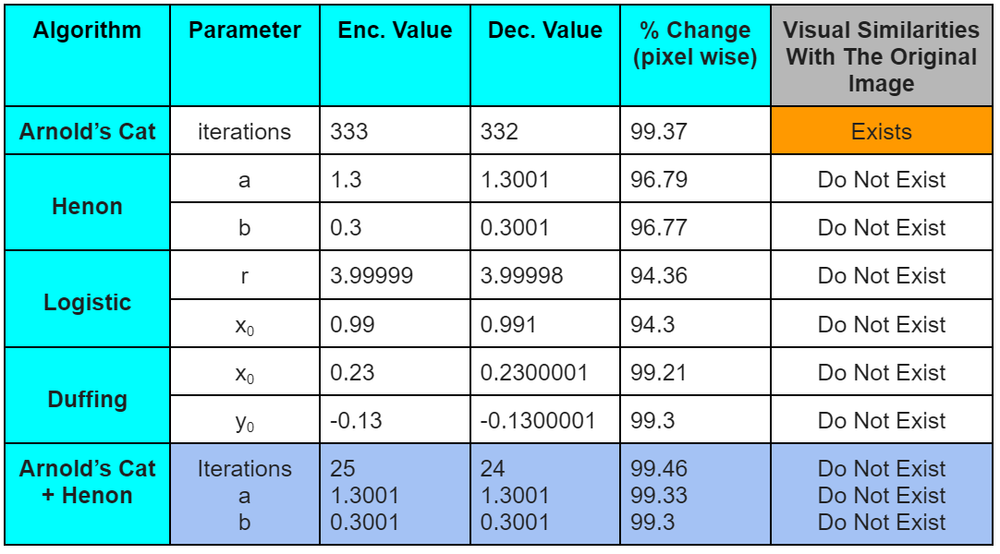

--> When using slightly changed parameters in decryption, Arnold's Cat is the most sensitive if we compare the two images pixel by pixel. But When looking at the image as a whole, a clear weakness is shown since you can see distorted parts of the original image.

Arnold decryption using 332 iterations.

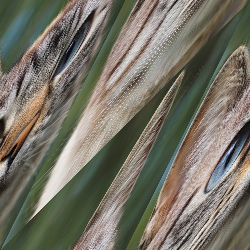